In [1]:
import os
import numpy as np
import cv2
import pandas as pd
import time
import matplotlib.pyplot as plt

import sys
sys.path.append('/mnt/disk1/yunseob/Pytorch/1_CapsuleEndo/algorithms')
from ce_utils.record import printProgress, Sec_to_M_S_ms
from ce_utils.video import load_frame, find_clip_idxs, merging, captioning
from ce_utils.data import batch_idxs, Reshape4torch
from ce_model.CNN_inference import CNN_model

In [2]:
model_dir = '/mnt/disk1/yunseob/Pytorch/1_CapsuleEndo/experiments/2_training_whole_data/model/'
gpu_idx = 3

model = CNN_model(network = 'CNN_v1', n_ch = 3, n_cls = 2, 
                  model_dir = model_dir, model_name = 'np_binary', gpu_idx = gpu_idx)

model: np_binary_0.0001_8_2009101037_199_t_accr_0.9819_t_loss_0.331068_v_accr_0.9400_v_loss_0.373449.pt 



In [3]:
model_dir = '/mnt/disk1/yunseob/Pytorch/1_CapsuleEndo/experiments/0_data_aug/model/'

model2 = CNN_model(network = 'CNN_v1', n_ch = 3, n_cls = 2, 
                  model_dir = model_dir, model_name = 'B_-r-', gpu_idx = gpu_idx)

model: B_-r-_0.0001_8_2007161324_046_t_accr_0.9800_t_loss_0.333166_v_accr_0.9740_v_loss_0.339054.pt 



In [4]:
# Saving Frames of Video.py 실행 ==> 해당 위치에 readme.txt 파일과 01~ 넘버링의 프레임 담은 폴더 생성
# 폴더 내 프레임은 영상을 프레임단위로 저장한 이미지 파일들

# Frame 들을 담은 저장위치
frame_root = '/mnt/disk2/data/private_data/SMhospital/capsule/0 data/video/200917 videos for AI feedback/'

# readme.txt 읽어옴
# df = pd.read_csv(frame_root + 'readme.txt', header = None, encoding = "cp949")
# video_log = pd.read_csv(frame_root + 'readme.txt', header = 0, encoding = "utf-8")
video_log = pd.read_csv(frame_root + 'readme.txt', header = 0, delimiter = '|', encoding = "utf-8")

# patient_dict 에 환자 이름과 save time을 함께 저장 
# patient_dict = {}
# for contents in df.loc[:, 0]:
#     print(contents)
#     split = contents.split('|')
#     index, patient, elapsed_time, n_frame  = split[0], split[1], split[2], split[3] 
#     patient_dict[index] = [patient, elapsed_time, n_frame]

    
# 최종 처리 이후 csv 파일에 들어갈 column 이름들 (for statistical analysis)
record = pd.DataFrame(columns = ['index', 'video', '# of frames', 'video length', 'save frame time', 'load frame time', 
                                 'pred. time(b)', '# of positive frames(b)', '# of clip frames(b)', 'clip length(b)',
                                 'Grad-CAM time(b)','process and save time(b)',])

In [5]:
video_log

,index,video,elapsed time,number of frames
0,1,Gang dae gue (30423812) 28 Oct 16_1.mpg,02:23.260,19390
1,2,Iana Timofeeva (30556004) 09 Jan 17_1.mpg,00:42.591,6116
2,3,Irina Pavlikovskaya (30596206) 13 Aug 18_1.mpg,01:16.507,10629
3,4,Kim soon bok (25268124) 26 Oct 16_1.mpg,00:28.131,3955
4,5,byon jeong suk (29675085) 06 Jul 17_1.mpg,01:58.696,16447
5,6,jang man bong (31233502) 08 Jul 17_1.mpg,02:03.915,17011
6,7,kim hong man (30293881) 06 Jul 17_1.mpg,01:02.397,8657


In [6]:
def load_frames(frame_dir):
    #frame 디렉토리에 있는 이미지 파일 이름 가져와서 정렬
    frame_names = np.sort(os.listdir(frame_dir))
    n_frame = frame_names.shape[0]
    frames_pre = []
    
    #이미지 불러오는 시작 시간 
    start_time = time.time()
    for i, frame_name in enumerate(frame_names):
        # 프레임 불러와서 frames_pre 에 저장 
        frame = load_frame(os.path.join(frame_dir, frame_name))
        frames_pre.append(frame)
        printProgress(i+1, n_frame, prefix = n_frame, suffix = 'loading frames', barLength = 80)
    frames_pre = np.asarray(frames_pre)
    time_taken = time.time() - start_time
    time_taken = Sec_to_M_S_ms(time_taken)
    # 리턴으로 불러온 프레임들과 걸린 시간 
    return frames_pre, time_taken

def model_pred(model, frames_pre):
    model.inference(Reshape4torch(frames_pre), batch_size = 16)
    probs = model.score
    pred_time = model.pred_time
    return probs, pred_time

def find_clip_idxs(pred_idx, n_frame):
    assert len(pred_idx) > 0, 'model must predict a image as positive at least'
    clip_idx = []
    for p_idx in pred_idx:
        clip_idx += [p_idx + i - 5 for i in range(11) if (p_idx + i-5) < n_frame and (p_idx + i-5) >= 0]
    return np.asarray(sorted(set(clip_idx)))
    
#     for p_idx in pred_idx:
#         clip_idx.append([idx + i - 5 for i in range(11)])
#     clip_idx = np.concatenate(clip_idx)
#     clip_idx = np.unique(clip_idx)
#     idx_start = np.where(clip_idx >= 0)
#     idx_end = np.where(clip_idx < n_frame)
#     return clip_idx[np.intersect1d(idx_start, idx_end)]


# def get_gradcam(model, frames_pre, clip_idx):
#     start_time = time.time()

#     cams = []
#     for i, c_idx in enumerate(clip_idx):
#         gradcam = model.extract_gradcam(Reshape4torch(frames_pre[c_idx]))
#         heatmap = cv2.applyColorMap((gradcam[0]*255).astype('uint8'), cv2.COLORMAP_JET)
#         cam_on_img = (heatmap*0.3 + frames_pre[c_idx]*0.7).astype('uint8')
#         cams.append(cam_on_img)
        
#         printProgress(i+1, len(clip_idx), barLength = 80,
#                       prefix = len(clip_idx), suffix = 'get gradcam in clip frame')
       
#     cams = np.concatenate([cams])

#     cam_time = time.time() - start_time
#     cam_time = Sec_to_M_S_ms(cam_time)
    
#     return cams, cam_time

def get_gradcam(model, frames_pre, clip_idx, batch_size, target_layers = ['conv6_2'], target_class = 0):
    start_time = time.time()
    batches = batch_idxs(clip_idx, batch_size)
    cams = []
    
    for i, batch in enumerate(batches):
        cam_on_img = model.extract_gradcam(Reshape4torch(frames_pre[clip_idx[batch]]), target_layers, target_class)
        cams.append(cam_on_img)
        
        printProgress(i+1, len(batches), barLength = 80,
                      prefix = '{}(*{})'.format(len(batches), batch_size), suffix = 'get gradcam in clip frame')
       
    cams = np.concatenate(cams)

    cam_time = time.time() - start_time
    cam_time = Sec_to_M_S_ms(cam_time)
    
    return cams, cam_time

def get_forward_attention(model, frames_pre, clip_idx, batch_size, target_layers = ['conv6_2']):
    start_time = time.time()
    batches = batch_idxs(clip_idx, batch_size)
    cams = []
    
    for i, batch in enumerate(batches):
        cam_on_img = model.extract_forward_attention(Reshape4torch(frames_pre[clip_idx[batch]]), target_layers)
        cams.append(cam_on_img)
        
        printProgress(i+1, len(batches), barLength = 80,
                      prefix = '{}(*{})'.format(len(batches), batch_size), suffix = 'get gradcam in clip frame')
       
    cams = np.concatenate(cams)

    cam_time = time.time() - start_time
    cam_time = Sec_to_M_S_ms(cam_time)
    
    return cams, cam_time

def process_and_save(frame_dir, save_dir, cams, preds, clip_idx, model_type = 'binary'):
    
    frame_names = np.sort(os.listdir(frame_dir))
    if not(os.path.isdir(save_dir)):
        os.makedirs(save_dir)
        os.makedirs(save_dir + 'clip_frame')
        os.makedirs(save_dir + 'pred_frame')
    
    start_time = time.time()
    for i, idx in enumerate(clip_idx):
        image = cv2.imread(os.path.join(frame_dir, frame_names[idx]))
        merged = merging(image, cams[i])
        captioning(merged, preds[idx], model_type)
        cv2.imwrite(save_dir + 'clip_frame/' + frame_names[idx], merged)
        if model_type == 'binary':
            if np.argmax(preds[idx]) == 1:
                cv2.imwrite(save_dir + 'pred_frame/' + frame_names[idx], merged)
        elif model_type == 'ensemble':
            if np.argmax(preds[idx][:2]) == 1:
                cv2.imwrite(save_dir + 'pred_frame/' + frame_names[idx], merged)
        printProgress(i+1, len(clip_idx), prefix = len(clip_idx), suffix = 'process and save --> {}'.format(save_dir), 
                      barLength = 80)
    time_taken = time.time() - start_time
    time_taken = Sec_to_M_S_ms(time_taken)
    return time_taken

In [7]:
frames_pre, frame_load_time = load_frames('/mnt/disk2/data/private_data/SMhospital/capsule/0 data/video/200917 videos for AI feedback/04')

3955 |################################################################################ | 100.0% loading frames


In [8]:
frame_load_time

'00:50.450'

In [9]:
frames_pre.shape

(3955, 512, 512, 3)

## nh_binary

- 전체 lesion을 abnormal로 학습한 모델 
- abnormal class안에 variation을 다양해서 포괄적으로 feature learning이 될 것이고 
- localization 성능이 떨어졌을 것으로 생각되어짐

In [10]:
preds, pred_time = model_pred(model, frames_pre)

pred_idx = np.where(np.argmax(preds, axis = 1) == 1)[0]
clip_idx = find_clip_idxs(pred_idx, len(frames_pre))

248(*16) |################################################################################ | 100.0% model prediction


In [11]:
cams0, cam_time = get_gradcam(model, frames_pre, clip_idx, batch_size = 64, target_layers = ['conv7_2'], target_class = 0)
cams, cam_time = get_gradcam(model, frames_pre, clip_idx, batch_size = 64, target_layers = ['conv7_2'], target_class = 1)
cams_, cam_time = get_gradcam(model, frames_pre, clip_idx, batch_size = 64, target_layers = ['conv7_2'], target_class = None)

26(*64) |################################################################################ | 100.0% get gradcam in clip frame
26(*64) |################################################################################ | 100.0% get gradcam in clip frame
26(*64) |################################################################################ | 100.0% get gradcam in clip frame


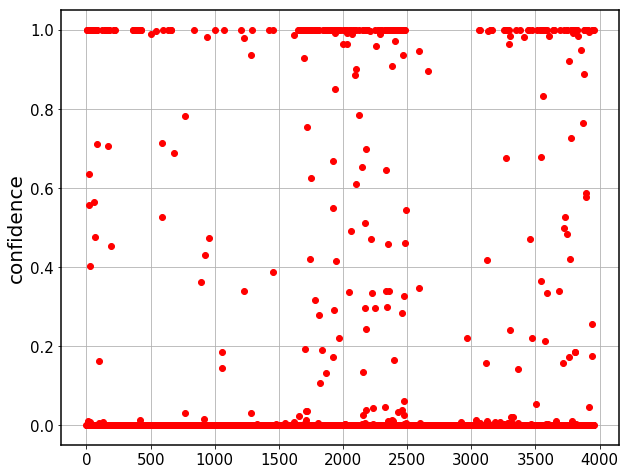

In [15]:
fig = plt.figure(figsize = (10, 8))
ax = fig.add_subplot(111)
ax.plot(preds[:, 1], 'o', color = 'r')

ax.tick_params(axis="x", labelsize=12)
ax.tick_params(axis="y", labelsize=12)
ax.tick_params(labelsize = 15)
# ax.set_title('{}'.format(model), fontsize = 20)
# ax.set_xlabel('training dataset', fontsize = 20)
ax.set_ylabel('confidence', fontsize = 20)

ax.spines['top'].set_linewidth(1.5)
ax.spines['right'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_linewidth(1.5)
ax.grid()
fig.show()

In [32]:
len(np.where(preds[:, 1] > 0.5)[0])

272

In [31]:
len(np.where(preds[:, 1] < 0.1)[0])

3624

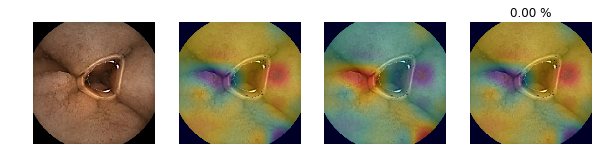

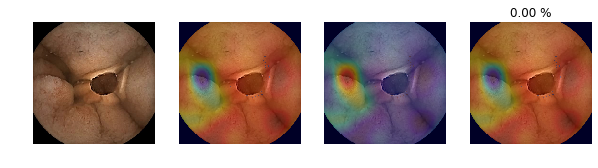

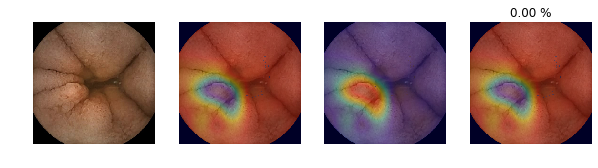

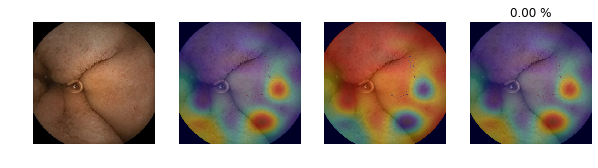

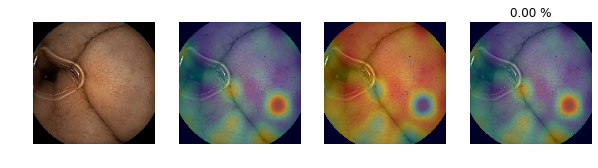

...

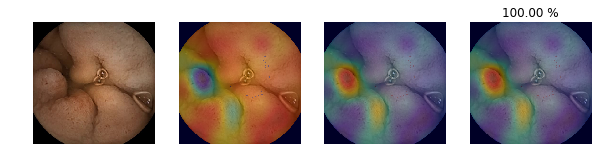

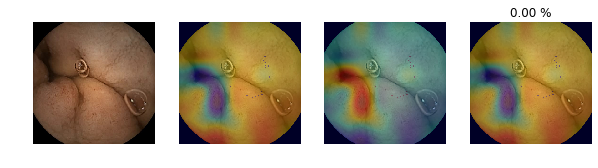

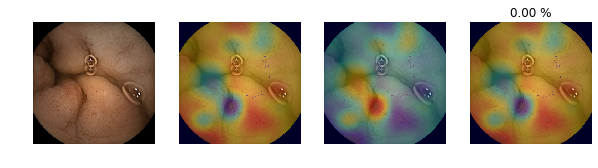

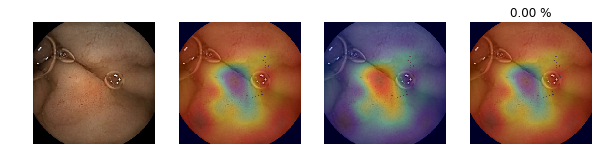

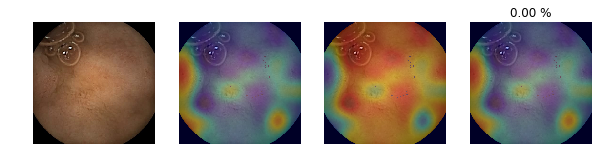

In [29]:
for i in range(90, 120):
    fig, ax = plt.subplots(1, 4, figsize = (10, 20))
    ax[0].imshow(cv2.cvtColor(frames_pre[clip_idx[i]], cv2.COLOR_BGR2RGB))
    ax[0].axis('off')
    ax[1].imshow(cv2.cvtColor(cams0[i], cv2.COLOR_BGR2RGB))
    ax[1].axis('off')
    ax[2].imshow(cv2.cvtColor(cams[i], cv2.COLOR_BGR2RGB))
    ax[2].axis('off')
    ax[3].set_title('{:.2f} %'.format(100*preds[clip_idx[i], 1]))
    ax[3].imshow(cv2.cvtColor(cams_[i], cv2.COLOR_BGR2RGB))
    ax[3].axis('off')
    fig.show()

/home/yunseob/Pytorch/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


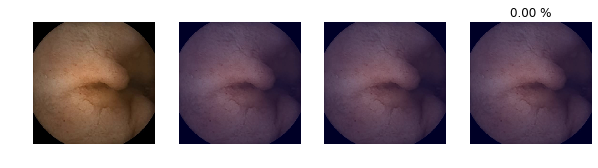

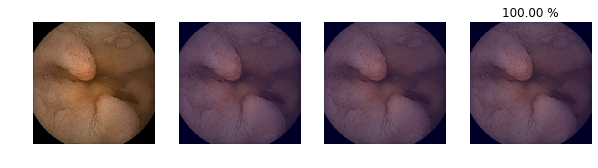

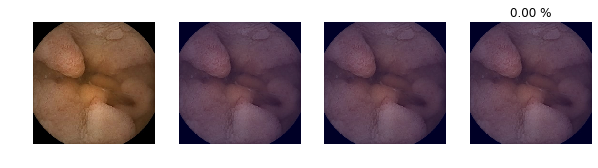

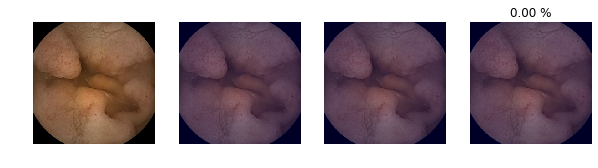

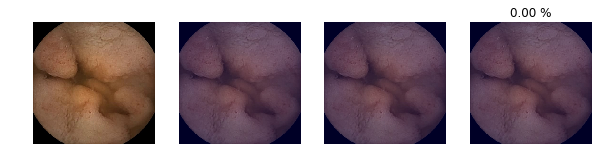

...

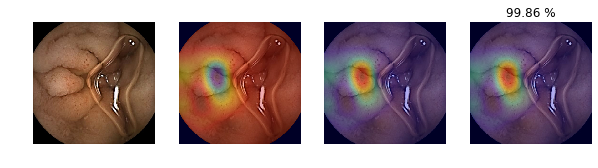

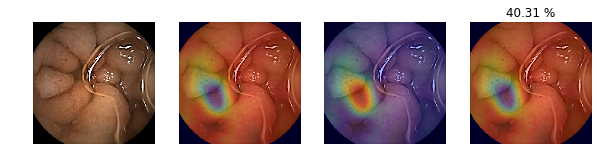

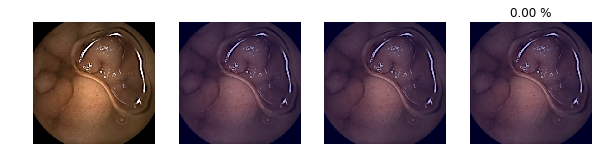

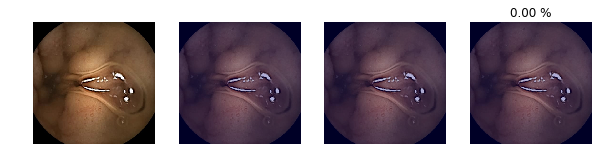

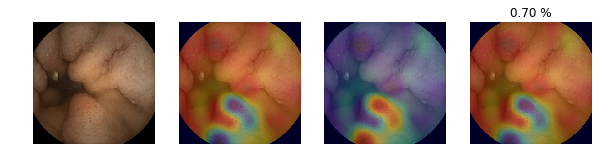

In [12]:
# logits = F.softmax(x, -1)
# without cam = np.maximum(cam, 0)

for i in range(0, 30):
    fig, ax = plt.subplots(1, 4, figsize = (10, 20))
    ax[0].imshow(cv2.cvtColor(frames_pre[clip_idx[i]], cv2.COLOR_BGR2RGB))
    ax[0].axis('off')
    ax[1].imshow(cv2.cvtColor(cams0[i], cv2.COLOR_BGR2RGB))
    ax[1].axis('off')
    ax[2].imshow(cv2.cvtColor(cams[i], cv2.COLOR_BGR2RGB))
    ax[2].axis('off')
    ax[3].set_title('{:.2f} %'.format(100*preds[clip_idx[i], 1]))
    ax[3].imshow(cv2.cvtColor(cams_[i], cv2.COLOR_BGR2RGB))
    ax[3].axis('off')
    fig.show()

/home/yunseob/Pytorch/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


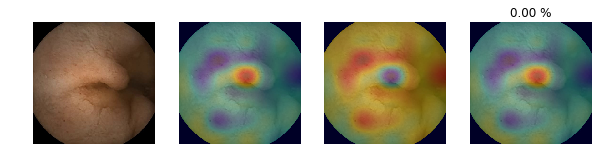

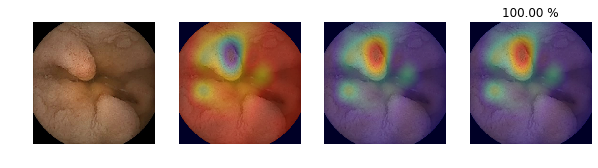

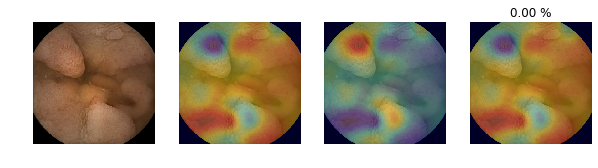

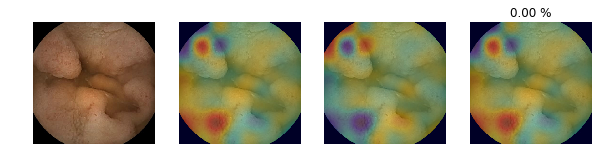

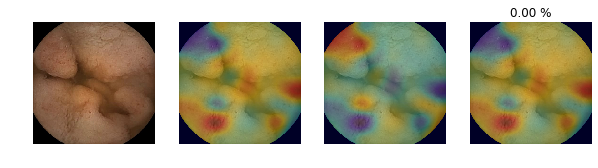

...

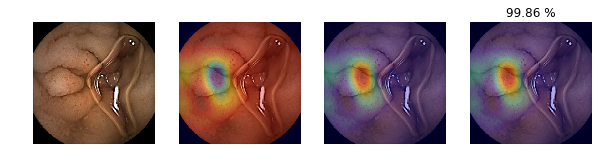

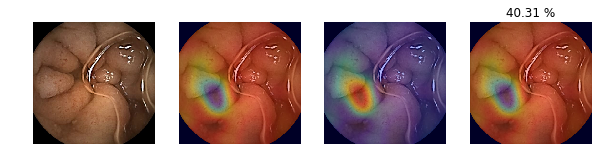

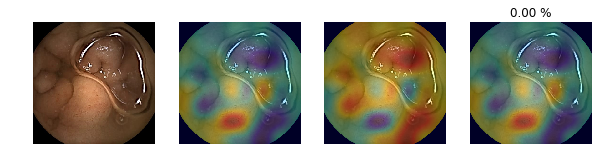

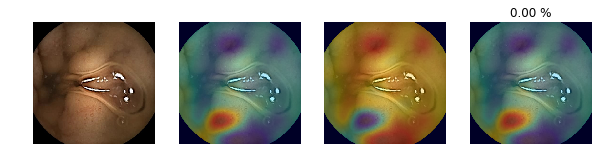

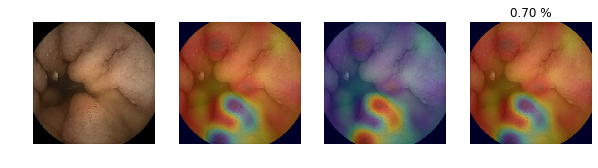

In [12]:
# logits = x
# without cam = np.maximum(cam, 0)

for i in range(0, 30):
    fig, ax = plt.subplots(1, 4, figsize = (10, 20))
    ax[0].imshow(cv2.cvtColor(frames_pre[clip_idx[i]], cv2.COLOR_BGR2RGB))
    ax[0].axis('off')
    ax[1].imshow(cv2.cvtColor(cams0[i], cv2.COLOR_BGR2RGB))
    ax[1].axis('off')
    ax[2].imshow(cv2.cvtColor(cams[i], cv2.COLOR_BGR2RGB))
    ax[2].axis('off')
    ax[3].set_title('{:.2f} %'.format(100*preds[clip_idx[i], 1]))
    ax[3].imshow(cv2.cvtColor(cams_[i], cv2.COLOR_BGR2RGB))
    ax[3].axis('off')
    fig.show()

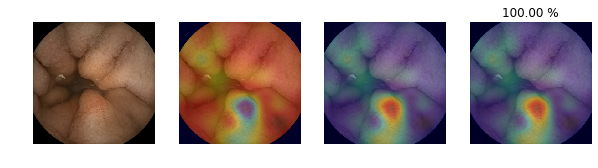

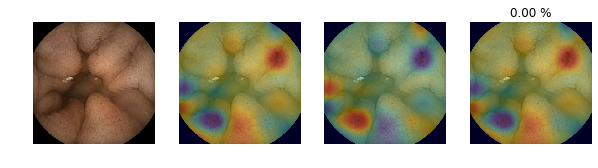

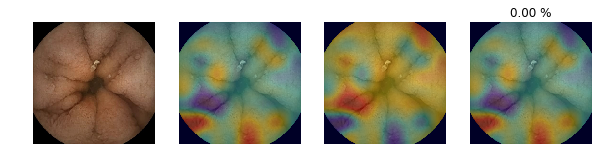

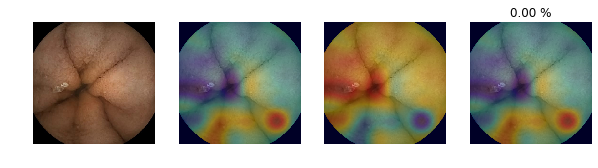

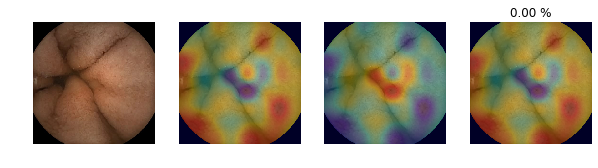

...

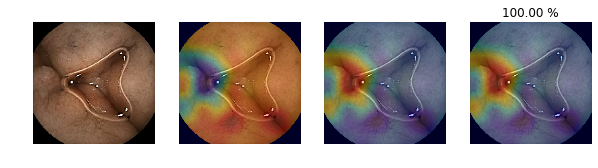

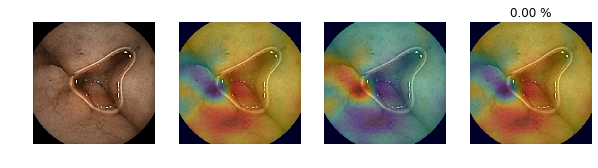

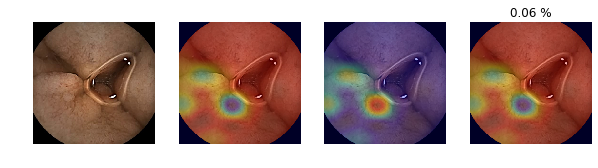

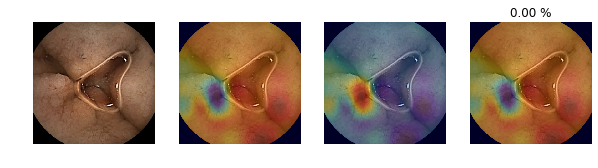

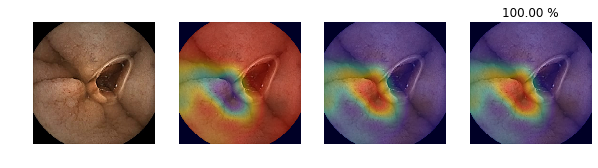

In [13]:
# logits = x
# without cam = np.maximum(cam, 0)

for i in range(30, 60):
    fig, ax = plt.subplots(1, 4, figsize = (10, 20))
    ax[0].imshow(cv2.cvtColor(frames_pre[clip_idx[i]], cv2.COLOR_BGR2RGB))
    ax[0].axis('off')
    ax[1].imshow(cv2.cvtColor(cams0[i], cv2.COLOR_BGR2RGB))
    ax[1].axis('off')
    ax[2].imshow(cv2.cvtColor(cams[i], cv2.COLOR_BGR2RGB))
    ax[2].axis('off')
    ax[3].set_title('{:.2f} %'.format(100*preds[clip_idx[i], 1]))
    ax[3].imshow(cv2.cvtColor(cams_[i], cv2.COLOR_BGR2RGB))
    ax[3].axis('off')
    fig.show()

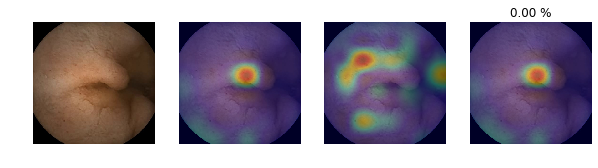

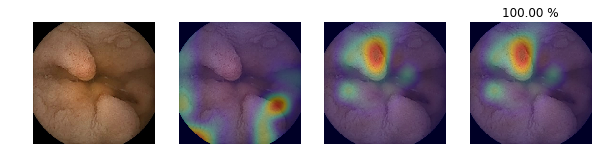

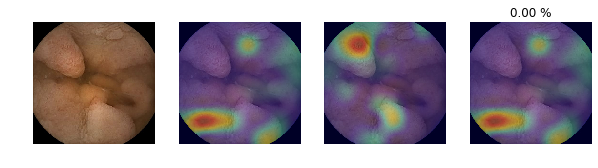

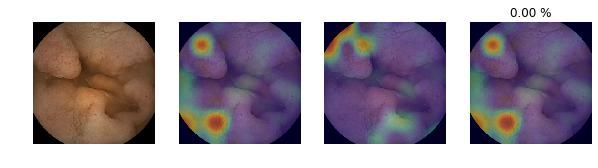

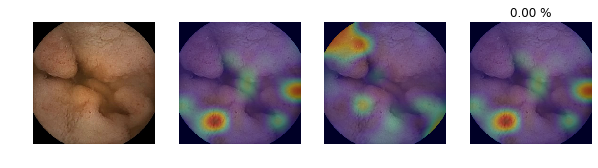

...

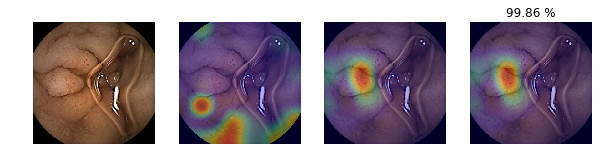

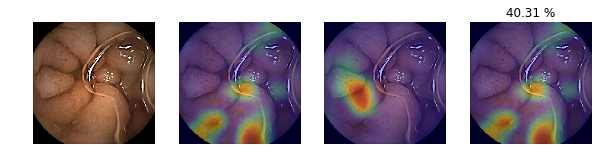

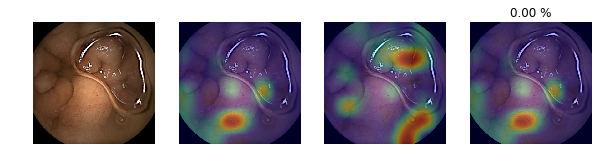

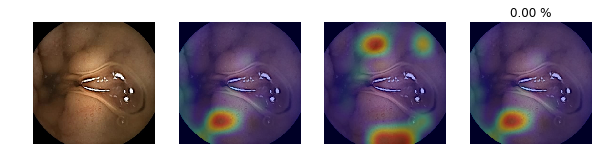

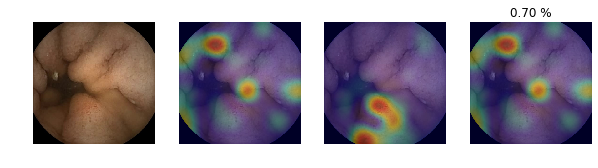

In [20]:
# logits = x
# cam = np.maximum(cam, 0)

for i in range(0, 30):
    fig, ax = plt.subplots(1, 4, figsize = (10, 20))
    ax[0].imshow(cv2.cvtColor(frames_pre[clip_idx[i]], cv2.COLOR_BGR2RGB))
    ax[0].axis('off')
    ax[1].imshow(cv2.cvtColor(cams0[i], cv2.COLOR_BGR2RGB))
    ax[1].axis('off')
    ax[2].imshow(cv2.cvtColor(cams[i], cv2.COLOR_BGR2RGB))
    ax[2].axis('off')
    ax[3].set_title('{:.2f} %'.format(100*preds[clip_idx[i], 1]))
    ax[3].imshow(cv2.cvtColor(cams_[i], cv2.COLOR_BGR2RGB))
    ax[3].axis('off')
    fig.show()